In [83]:
# importing the required libraries
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline
from statsmodels.api import add_constant
from sklearn import  model_selection
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

In [84]:
#data importing
data=pd.read_csv('PL_XSELL.csv')

In [85]:
data.head()

,CUST_ID,TARGET,AGE,GENDER,BALANCE,OCCUPATION,AGE_BKT,SCR,HOLDING_PERIOD,ACC_TYPE,...,NO_OF_IW_CHQ_BNC_TXNS,NO_OF_OW_CHQ_BNC_TXNS,AVG_AMT_PER_ATM_TXN,AVG_AMT_PER_CSH_WDL_TXN,AVG_AMT_PER_CHQ_TXN,AVG_AMT_PER_NET_TXN,AVG_AMT_PER_MOB_TXN,FLG_HAS_NOMINEE,FLG_HAS_OLD_LOAN,random
0,C7927,0,27,M,3383.75,SELF-EMP,26-30,776,30,SA,...,0,0,13100.0,0.0,0.0,486778.50,0.0,1,1,0.000011
1,C6877,0,47,M,287489.04,SAL,46-50,324,28,SA,...,0,0,6600.0,0.0,0.0,799813.00,0.0,1,0,0.000111
2,C19922,0,40,M,18216.88,SELF-EMP,36-40,603,2,SA,...,0,1,11200.0,561120.0,24660.0,997570.00,0.0,1,1,0.000120
3,C8183,0,53,M,71720.48,SAL,>50,196,13,CA,...,0,0,13050.0,168397.5,15195.0,247168.67,71388.0,1,0,0.000137
4,C12123,0,36,M,1671622.89,PROF,36-40,167,24,SA,...,0,0,0.0,808480.0,0.0,0.00,0.0,1,0,0.000174


In [86]:
# target variabe value count
data.TARGET.value_counts()

0    17488
1     2512
Name: TARGET, dtype: int64

In [87]:
# dropping the variable with is not fitting the model
data=data.drop(['AGE_BKT','ACC_OP_DATE','CUST_ID'],axis=1)

In [88]:
data.shape

(20000, 37)

In [90]:
# checking the missing value
data.isnull().sum()

TARGET                      0
AGE                         0
GENDER                      0
BALANCE                     0
OCCUPATION                  0
SCR                         0
HOLDING_PERIOD              0
ACC_TYPE                    0
LEN_OF_RLTN_IN_MNTH         0
NO_OF_L_CR_TXNS             0
NO_OF_L_DR_TXNS             0
TOT_NO_OF_L_TXNS            0
NO_OF_BR_CSH_WDL_DR_TXNS    0
NO_OF_ATM_DR_TXNS           0
NO_OF_NET_DR_TXNS           0
NO_OF_MOB_DR_TXNS           0
NO_OF_CHQ_DR_TXNS           0
FLG_HAS_CC                  0
AMT_ATM_DR                  0
AMT_BR_CSH_WDL_DR           0
AMT_CHQ_DR                  0
AMT_NET_DR                  0
AMT_MOB_DR                  0
AMT_L_DR                    0
FLG_HAS_ANY_CHGS            0
AMT_OTH_BK_ATM_USG_CHGS     0
AMT_MIN_BAL_NMC_CHGS        0
NO_OF_IW_CHQ_BNC_TXNS       0
NO_OF_OW_CHQ_BNC_TXNS       0
AVG_AMT_PER_ATM_TXN         0
AVG_AMT_PER_CSH_WDL_TXN     0
AVG_AMT_PER_CHQ_TXN         0
AVG_AMT_PER_NET_TXN         0
AVG_AMT_PE

In [91]:
#describing the data
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TARGET,20000.0,0.125600,0.331406,0.000000,0.000000,0.000000,0.000000e+00,1.000000e+00
AGE,20000.0,38.418150,9.577985,21.000000,30.000000,38.000000,4.600000e+01,5.500000e+01
BALANCE,20000.0,511362.192118,723592.961792,0.000000,64754.025000,231675.845000,6.538768e+05,8.360431e+06
SCR,20000.0,440.150300,249.887582,100.000000,227.000000,364.000000,6.440000e+02,9.990000e+02
HOLDING_PERIOD,20000.0,14.955650,8.642634,1.000000,7.000000,15.000000,2.200000e+01,3.100000e+01
LEN_OF_RLTN_IN_MNTH,20000.0,125.239300,54.953936,29.000000,79.000000,125.000000,1.720000e+02,2.210000e+02
NO_OF_L_CR_TXNS,20000.0,12.348050,12.151921,0.000000,6.000000,10.000000,1.400000e+01,7.500000e+01
NO_OF_L_DR_TXNS,20000.0,6.633700,7.675830,0.000000,2.000000,5.000000,7.000000e+00,7.400000e+01
TOT_NO_OF_L_TXNS,20000.0,18.975400,17.759290,0.000000,9.000000,14.000000,2.100000e+01,1.490000e+02
NO_OF_BR_CSH_WDL_DR_TXNS,20000.0,1.883000,2.263596,0.000000,1.000000,1.000000,2.000000e+00,1.500000e+01


# Target variabke Analysis

In [92]:
# Count of reponses
data.TARGET.value_counts()/20000*100

0    87.44
1    12.56
Name: TARGET, dtype: float64

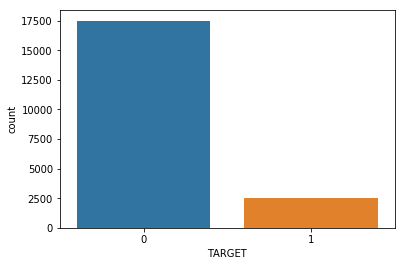

In [93]:
# count plot
sns.countplot(data['TARGET'])
plt.show()

C:\Users\HEMNATH\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


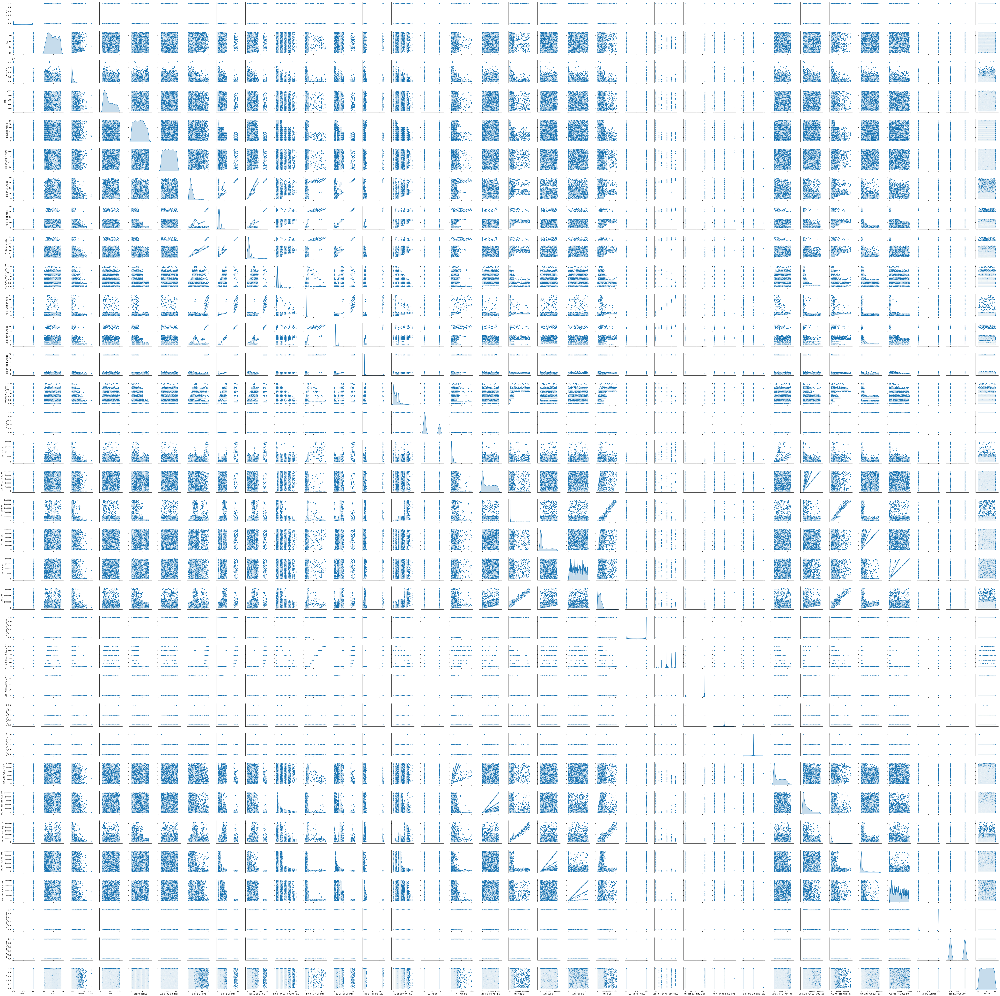

In [94]:
# vizualization of data
sns.pairplot(data,diag_kind='kde')
plt.show()

In [95]:
data.dtypes

TARGET                        int64
AGE                           int64
GENDER                       object
BALANCE                     float64
OCCUPATION                   object
SCR                           int64
HOLDING_PERIOD                int64
ACC_TYPE                     object
LEN_OF_RLTN_IN_MNTH           int64
NO_OF_L_CR_TXNS               int64
NO_OF_L_DR_TXNS               int64
TOT_NO_OF_L_TXNS              int64
NO_OF_BR_CSH_WDL_DR_TXNS      int64
NO_OF_ATM_DR_TXNS             int64
NO_OF_NET_DR_TXNS             int64
NO_OF_MOB_DR_TXNS             int64
NO_OF_CHQ_DR_TXNS             int64
FLG_HAS_CC                    int64
AMT_ATM_DR                    int64
AMT_BR_CSH_WDL_DR             int64
AMT_CHQ_DR                    int64
AMT_NET_DR                  float64
AMT_MOB_DR                    int64
AMT_L_DR                    float64
FLG_HAS_ANY_CHGS              int64
AMT_OTH_BK_ATM_USG_CHGS       int64
AMT_MIN_BAL_NMC_CHGS          int64
NO_OF_IW_CHQ_BNC_TXNS       

In [98]:
# creating the dummies
df=pd.get_dummies(data,drop_first=True)
df.head()

,TARGET,AGE,BALANCE,SCR,HOLDING_PERIOD,LEN_OF_RLTN_IN_MNTH,NO_OF_L_CR_TXNS,NO_OF_L_DR_TXNS,TOT_NO_OF_L_TXNS,NO_OF_BR_CSH_WDL_DR_TXNS,...,AVG_AMT_PER_MOB_TXN,FLG_HAS_NOMINEE,FLG_HAS_OLD_LOAN,random,GENDER_M,GENDER_O,OCCUPATION_SAL,OCCUPATION_SELF-EMP,OCCUPATION_SENP,ACC_TYPE_SA
0,0,27,3383.75,776,30,146,7,3,10,0,...,0.0,1,1,0.000011,1,0,0,1,0,1
1,0,47,287489.04,324,28,104,8,2,10,0,...,0.0,1,0,0.000111,1,0,1,0,0,1
2,0,40,18216.88,603,2,61,10,5,15,1,...,0.0,1,1,0.000120,1,0,0,1,0,1
3,0,53,71720.48,196,13,107,36,14,50,4,...,71388.0,1,0,0.000137,1,0,1,0,0,0
4,0,36,1671622.89,167,24,185,20,1,21,1,...,0.0,1,0,0.000174,1,0,0,0,0,1


In [99]:
df.columns


Index(['TARGET', 'AGE', 'BALANCE', 'SCR', 'HOLDING_PERIOD',
       'LEN_OF_RLTN_IN_MNTH', 'NO_OF_L_CR_TXNS', 'NO_OF_L_DR_TXNS',
       'TOT_NO_OF_L_TXNS', 'NO_OF_BR_CSH_WDL_DR_TXNS', 'NO_OF_ATM_DR_TXNS',
       'NO_OF_NET_DR_TXNS', 'NO_OF_MOB_DR_TXNS', 'NO_OF_CHQ_DR_TXNS',
       'FLG_HAS_CC', 'AMT_ATM_DR', 'AMT_BR_CSH_WDL_DR', 'AMT_CHQ_DR',
       'AMT_NET_DR', 'AMT_MOB_DR', 'AMT_L_DR', 'FLG_HAS_ANY_CHGS',
       'AMT_OTH_BK_ATM_USG_CHGS', 'AMT_MIN_BAL_NMC_CHGS',
       'NO_OF_IW_CHQ_BNC_TXNS', 'NO_OF_OW_CHQ_BNC_TXNS', 'AVG_AMT_PER_ATM_TXN',
       'AVG_AMT_PER_CSH_WDL_TXN', 'AVG_AMT_PER_CHQ_TXN', 'AVG_AMT_PER_NET_TXN',
       'AVG_AMT_PER_MOB_TXN', 'FLG_HAS_NOMINEE', 'FLG_HAS_OLD_LOAN', 'random',
       'GENDER_M', 'GENDER_O', 'OCCUPATION_SAL', 'OCCUPATION_SELF-EMP',
       'OCCUPATION_SENP', 'ACC_TYPE_SA'],
      dtype='object')

In [121]:
# seperating the dependent variable nd independent variable

In [100]:
x=df.drop('TARGET',axis=1)
y=df.TARGET
x_std=StandardScaler().fit_transform(x)
x_std=x.columns

C:\Users\HEMNATH\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\HEMNATH\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [101]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=1)

# Getting parameter using Gridsearch

In [102]:
model_dtgd=DecisionTreeClassifier(random_state=0)
parameter_dtgd={'max_depth':np.arange(1,10)}

model_rfgd=RandomForestClassifier(random_state=0)
parameter_rfgd={'n_estimators':np.arange(1,50),'max_depth':np.arange(1,10)}


In [103]:
grid_dt=GridSearchCV(model_dtgd,parameter_dtgd,cv=5)
grid_dt.fit(x,y)
grid_dt.best_params_

{'max_depth': 2}

In [104]:
grid_rf=GridSearchCV(model_rfgd,parameter_rfgd,cv=5)
grid_rf.fit(x,y)
grid_rf.best_params_

{'max_depth': 9, 'n_estimators': 49}

# Fitting the  CART Model

In [113]:
model_dt=DecisionTreeClassifier(max_depth=2,random_state=0)
model_dt.fit(x_train,y_train)
y_pre_dt=model_dt.predict(x_test)

model_rf=RandomForestClassifier(max_depth= 9, n_estimators= 49,criterion='entropy',random_state=0)
model_rf.fit(x_train,y_train)
y_pred_rf=model_rf.predict(x_test)

In [114]:
mod=[]
mod.append(('Decision Tree',model_dt))
mod.append(('Random Forest',model_rf))
results=[]
names=[]
scoring='accuracy'
for name,model in mod:
    kfold=model_selection.KFold(n_splits=10,random_state=2)
    cv_results=model_selection.cross_val_score(model,x,y,cv=kfold,scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg='The accuracy of %s is:%f(%f)'%(name,cv_results.mean(),cv_results.std())
    print(msg)

The accuracy of Decision Tree is:0.874400(0.007113)
The accuracy of Random Forest is:0.886100(0.007358)


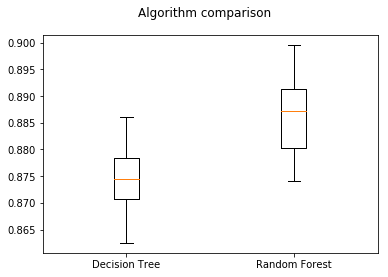

In [115]:
fig=plt.figure()
fig.suptitle('Algorithm comparison')
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# ROC and AUC

In [116]:
pred_train_proba=model_dt.predict_proba(x_train)
pred_test_proba=model_dt.predict_proba(x_test)
pred_train_proba1=model_rf.predict_proba(x_train)
pred_test_proba1=model_rf.predict_proba(x_test)

C:\Users\HEMNATH\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


(-0.05, 1.05)

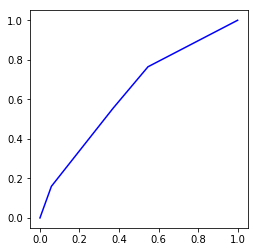

In [117]:
fpr,tpr,thershold=metrics.roc_curve(y_test,pred_test_proba[:,1])
plt.plot(fpr,tpr,label='ROC curve',color='b')
plt.axes().set_aspect('equal')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])

In [118]:
AUC=metrics.auc(fpr,tpr)
print(AUC)

0.6327314970450468


C:\Users\HEMNATH\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


(-0.05, 1.05)

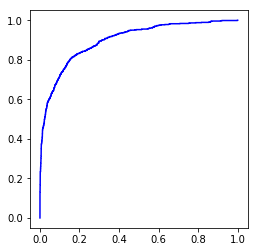

In [119]:
fpr1,tpr1,thershold1=metrics.roc_curve(y_test,pred_test_proba1[:,1])
plt.plot(fpr1,tpr1,label='ROC curve',color='b')
plt.axes().set_aspect('equal')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])

In [120]:
AUC=metrics.auc(fpr1,tpr1)
print(AUC)

0.8990989688722308
